<a href="https://colab.research.google.com/github/ShounakDas101/AIML_Hari/blob/main/WaveEqnGSoC24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 7. Computational Wave Function for Decision-Making
Possible mentors: Paavo Pylkkänen (paavo.pylkkanen@helsinki.fi), Francis Steen (profsteen@gmail.com), and colleagues

Default but negotiable size: medium 175 hour project.

Difficulty: MEDIUM-HARD

Description:  Decision-making involves the simultaneous consideration of multiple alternatives. Develop a computational model of elementary decision-making using Schrödinger's wave equation, leveraging the idea that quantum wave functions have multiple valid latent solutions and that some to-be-defined process leads to the collapse of the wave function into a single outcome. Model the simplest conditions required to map decision-making onto wave equations, so that they can function as computational engines. The application domain can be physical navigation of a simple organism towards a food source, a perceptual process, or an artificial life process.

Expected outcome: A working computational toy model of quantum decision-making that can serve a platform for iterative improvements and elaborations

Skills required: A basic familiarity with Schrödinger's wave equation and preferably some experience with computational modeling of dynamic systems

# The Time-Dependent Schrodinger's Wave Equation

The Time Dependent Schrodinger Equation (in a position basis with infinite boundaries) is

$$ i \hbar \frac{\partial}{\partial t} \psi(x,t) = -\frac{\hbar^2}{2m}\frac{\partial^2}{\partial x^2}\psi(x,t) + V(x) \psi(x,t) \hspace{20mm} \text{Boundary Condition is  } \psi(0, t) = \psi(L,t)=0 $$

Schrodinger Equation with variable quadratic Hamiltonians of the form
$$ i \frac{\partial}{\partial t} \psi(x,t) = -a(t)\frac{\partial^2}{\partial x^2}\psi(x,t) + V(x) \psi(x,t) -i\Biggl(c(t)x\frac{\partial}{\partial x} \psi(x,t)+d(t)\psi(x,t)\Biggr) - f(t)x\psi(x,t)-ig(t)\frac{\partial}{\partial x} \psi(x,t)\hspace{20mm} \text{Boundary Condition is  } \psi(0, t) = \psi(L,t)=0 \text{   a(t), c(t), d(t), f(t) and g(t) are real valued functions of time t only.} $$

# Finite Difference Method
Choose a discrete grid with spacing  Δx  and  Δt  and let $\psi_{j}^{m}=ψ(jΔx,mΔt)$

$$i\frac{\psi_{j}^{m+1} - \psi_{j}^{m}}{\Delta t} = - a(t)\frac{\psi_{j+1}^{m} -2\psi_j^m + \psi_{j-1}^{m}}{(\Delta x)^2} +V(x)\psi_j^m -ic(t)x\frac{\psi_{j+1}^{m} - \psi_{j}^{m}}{\Delta x} -id(t)\psi_j^m -f(t)x\psi_j^m + ig(t)\frac{\psi_{j+1}^{m} - \psi_{j}^{m}}{\Delta x}$$

or, $$\frac{\psi_{j}^{m+1} - \psi_{j}^{m}}{\Delta t} = i a(t)\frac{\psi_{j+1}^{m} -2\psi_j^m + \psi_{j-1}^{m}}{(\Delta x)^2} -iV(x)\psi_j^m -c(t)x\frac{\psi_{j+1}^{m} - \psi_{j}^{m}}{\Delta x} -d(t)\psi_j^m +if(t)x\psi_j^m + g(t)\frac{\psi_{j+1}^{m} - \psi_{j}^{m}}{\Delta x}$$

Rearrange the equation

$$\psi_{j}^{m+1} = \psi_j^m + {\Delta t} \Biggl(i a(t)\frac{\psi_{j+1}^{m} -2\psi_j^m + \psi_{j-1}^{m}}{(\Delta x)^2} -iV(x)\psi_j^m -c(t)x\frac{\psi_{j+1}^{m} - \psi_{j}^{m}}{\Delta x} -d(t)\psi_j^m +if(t)x\psi_j^m + g(t)\frac{\psi_{j+1}^{m} - \psi_{j}^{m}}{\Delta x}\Biggr)$$

# Codes for Finite State Difference
import all Libraries needed

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import PillowWriter
import numba
from numba import jit
from scipy.linalg import eigh_tridiagonal
plt.style.use(['default', 'default', 'default'])

Define all parameters of interest.

In [ ]:
Nx = 301
Nt = 100000
dx = 1/(Nx-1)
dt=1e-7
x = np.linspace(0, 1, Nx)

In [ ]:
# Nx = 301
# Nt = 100000
# dx = 1/(Nx-1)
# dt=1e-7
# x = np.linspace(0, 1, Nx)
# X = 3*(dx + x*dt)
# psi0 = np.sqrt(2)*np.sin(np.pi*x)
# mu1,mu2,mu3 ,sigma =.15, 1/2, .7,1/20
# V = -1e4*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu2)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))

In [ ]:
Nx = 301
Nt = 100000
dx = 1/(Nx-1)
dt=1e-7
x = np.linspace(0, 1, Nx)
a = 1/2
b = -1e4
c = .2*x
d = .2
f = .2*x
g = .2
X = (dx - g*dt + c*dt)
psi0 = np.sqrt(2)*np.sin(np.pi*x)
mu1,mu2,mu3 ,sigma =.15, 1/2, .7,1/20
#V = -1e4*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu2)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))
# V = b*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))
V = b*(np.exp(-(x-mu1)**2/(2*sigma**2)))

#V = -1e4*(np.exp(-(x-mu2)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))


Look at $dt/dx^2$ (this parameter should be small for the finite difference method to work).

In [ ]:
dt/dx**2

0.008999999999999998

Text(0, 0.5, '$V(x)$')

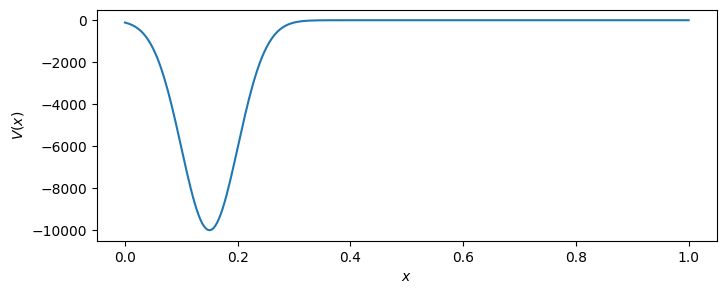

In [ ]:
plt.figure(figsize=(8,3))
plt.plot(x,V)
plt.xlabel('$x$')
plt.ylabel('$V(x)$')

Construct the array of $\psi(x,t)$ (two dimensions: one for $x$ and one for $t$)

In [ ]:
psi = np.zeros([Nt,Nx])
psi[0] = psi0

In [ ]:
psi

array([[0.00000000e+00, 1.48093391e-02, 2.96170542e-02, ...,
        2.96170542e-02, 1.48093391e-02, 1.73191211e-16],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

Numba algorithm to implement the finite difference method

In [ ]:
@numba.jit("c16[:,:](c16[:,:])", nopython=True, nogil=True)
def compute_psi(psi):
    for t in range(0, Nt-1):
        for i in range(1, Nx-1):
            #psi[t+1][i] = psi[t][i] + 1j/2 * dt/(dx*X[i]) * (psi[t][i+1] - 2*psi[t][i] + psi[t][i-1]) - 1j*dt*(dx/X[i])*V[i]*psi[t][i]
            #psi[t+1][i] = psi[t][i] + 1j* a * dt/(dx**2) * (psi[t][i+1] - 2*psi[t][i] + psi[t][i-1]) - 1j*dt*V[i]*psi[t][i] - d*dt*psi[t][i] - c[i]*(dt/dx)*(psi[t][i+1]-psi[t][i]) + 1j*dt*f[i]*psi[t][i] + g*(dt/dx)*(psi[t][i+1]-psi[t][i])
            psi[t+1][i] = psi[t][i] + dt*(1j* a/(dx**2) * (psi[t][i+1] - 2*psi[t][i] + psi[t][i-1]) - 1j*V[i]*psi[t][i] - d*psi[t][i] - (c[i]/dx)*(psi[t][i+1]-psi[t][i]) + 1j*f[i]*psi[t][i] + (g/dx)*(psi[t][i+1]-psi[t][i]))

        normal = np.sum(np.absolute(psi[t+1])**2)*dx
        for i in range(1, Nx-1):
            psi[t+1][i] = psi[t+1][i]/normal

    return psi

Compute $\psi(x,t)$ using method 1 (so we label m1)

In [ ]:
psi_m1 = compute_psi(psi.astype(complex))

# Plot for some given $m=10000$ (the dimensionless time is $t=m\Delta t$)

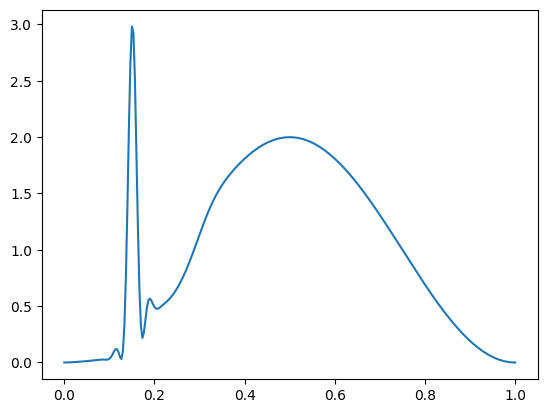

In [ ]:
plt.plot(x, np.absolute(psi_m1[10000])**2)
#np.sum(np.absolute(psi_m1[10000])**2)*dx

# Technique 2

Create the grid and define the initial condition $\psi(x,0)$

In [ ]:
Nx = 301
dx = 1/(Nx-1)
x = np.linspace(0, 1, Nx)
psi0 = np.sqrt(2)*np.sin(np.pi*x)

def V(x):
    mu1,mu2,mu3 ,sigma =.3, 1/2, .7,1/20
    return -1e4*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu2)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))
    # mu, sigma = 1/2, 1/20
    # return -1e4*np.exp(-(x-1/2)**2/(2*(1/20)**2))

Define the tridiagonal matrix required for solving for the eigenstates (see https://www.youtube.com/watch?v=ay0zZ8SUMSk for solving the time-independent Schrodinger equation, which is what we're doing here)

In [ ]:
d = 1/dx**2 + V(x)[1:-1]
e = -1/(2*dx**2) * np.ones(len(d)-1)
w, v = eigh_tridiagonal(d, e)

Compute eigenstates $\psi_j$ and eigen-energies $E_j$, and use $$\psi(x,t) = \sum_{j=0}^\infty c_j \psi_j(x) e^{-i E_j t} \hspace{20mm} c_j = \int_{-\infty}^{\infty} \psi(x, 0)\psi_j^*(x) dx$$ to get the $\psi(x,t)$

In [ ]:
E_js = w[0:70]
psi_js = np.pad(v.T[0:70], [(0, 0), (1, 1)], mode='constant')
cs = np.dot(psi_js, psi0)
def psi_m2(t):
    return psi_js.T@(cs*np.exp(-1j*E_js*t))

Plot the energy at time $t = 10000 \Delta t$

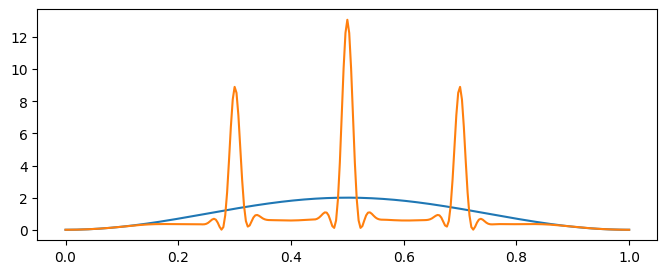

In [ ]:
plt.figure(figsize=(8,3))
plt.plot(x, psi0**2)
plt.plot(x, np.absolute(psi_m2(10000*dt))**2)

# Animation

Now we make an animation that shows the results of the two techniques, and that they give the same result.

In [ ]:
# def animate(i):
#     ln1.set_data(x, np.absolute(psi_m1[100*i])**2)
#     ln2.set_data(x, np.absolute(psi_m2(100*i*dt))**2)

#     # # Update the V line data to reflect the current frame's state:
#     # ln3.set_data(x, V)

#     time_text.set_text('$(10^4 mL^2)^{-1}t=$' + '{:.1f}'.format(100 * i * dt * 1e4))

# # Assuming values or definitions for x, psi_m1, psi_m2, dt, mu1, mu2, mu3, sigma

# fig, ax = plt.subplots(1, 1, figsize=(8, 4))
# #ax.grid()

# ln1, = plt.plot([], [], 'r-', lw=2, markersize=8, label='Method 1')
# ln2, = plt.plot([], [], 'b--', lw=3, markersize=8, label='Method 2')
# mu1,mu2,mu3 ,sigma =.15, 1/2, .7,1/20
# V=-1e4 * (np.exp(-(x - mu1)**2 / (2 * sigma**2)) +
#                            np.exp(-(x - mu2)**2 / (2 * sigma**2)) +
#                            np.exp(-(x - mu3)**2 / (2 * sigma**2)))


# time_text = ax.text(0.65, 16, '', fontsize=15,
#                     bbox=dict(facecolor='white', edgecolor='black'))

# ax.set_ylim(-1, 20)  # Adjust y-axis limits as necessary
# ax.set_xlim(0, 1)
# ax.set_ylabel('$|\psi(x)|^2$', fontsize=20)
# ax.set_xlabel('$x/L$', fontsize=20)
# ax.legend(loc='upper left')
# ax.set_title('$(mL^2)V(x) = -10^4 \cdot n(x, \mu=L/2, \sigma=L/20)$')

# plt.tight_layout()

# ani = animation.FuncAnimation(fig, animate, frames=1000, interval=50)
# ani.save('pen.gif', writer='pillow', fps=50, dpi=100)



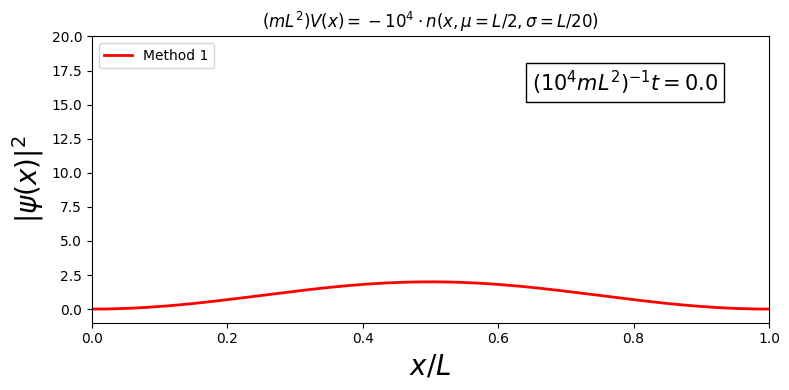

In [ ]:
def animate(i):
    ln1.set_data(x, np.absolute(psi_m1[100*i])**2)
    # ln2.set_data(x, np.absolute(psi_m2(100*i*dt))**2)
    time_text.set_text('$(10^4 mL^2)^{-1}t=$'+'{:.1f}'.format(100*i*dt*1e4))



fig, ax = plt.subplots(1,1, figsize=(8,4))
#ax.grid()
ln1, = plt.plot([], [], 'r-', lw=2, markersize=8, label='Method 1')
# ln2, = plt.plot([], [], 'b--', lw=3, markersize=8, label='Method 2')

time_text = ax.text(0.65, 16, '', fontsize=15,
bbox=dict(facecolor='white', edgecolor='black'))
ax.set_ylim(-1, 20)
ax.set_xlim(0,1)
ax.set_ylabel('$|\psi(x)|^2$', fontsize=20)
ax.set_xlabel('$x/L$', fontsize=20)
ax.legend(loc='upper left')
ax.set_title('$(mL^2)V(x) = -10^4 \cdot n(x, \mu=L/2, \sigma=L/20)$')
plt.tight_layout()
ani = animation.FuncAnimation(fig, animate, frames=1000, interval=50)
ani.save('pen.gif',writer='pillow',fps=50,dpi=100)

# plt.figure(figsize=(9,3))
# V = -1e4*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu2)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))
# plt.plot(x,V)
# plt.xlabel('$x$')
# plt.ylabel('$V(x)$')

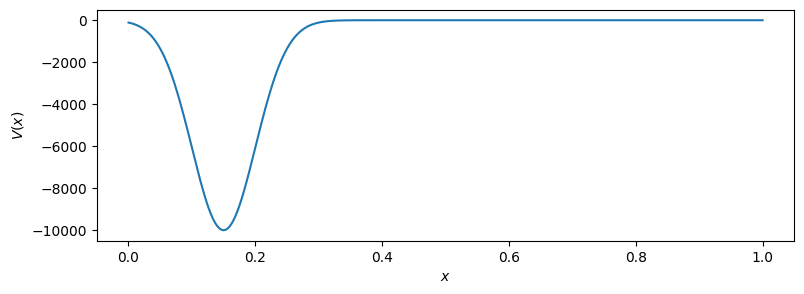

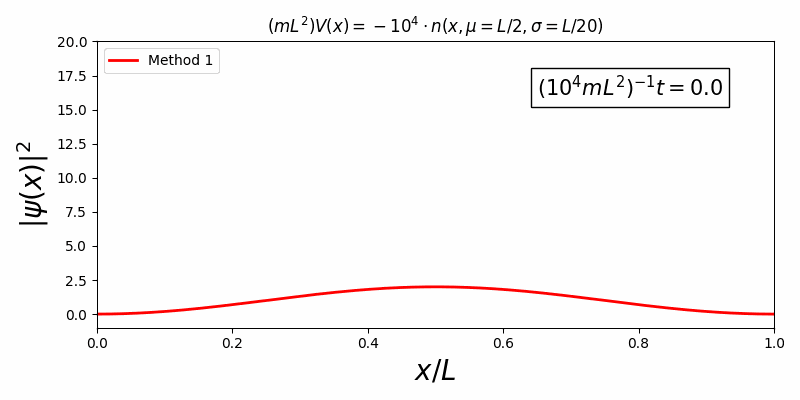

In [ ]:
from IPython.display import Image


plt.figure(figsize=(9,3))
# V = b*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))
V = b*(np.exp(-(x-mu1)**2/(2*sigma**2)))


# V = -1e4*(np.exp(-(x-mu1)**2/(2*sigma**2))+np.exp(-(x-mu2)**2/(2*sigma**2))+np.exp(-(x-mu3)**2/(2*sigma**2)))
plt.plot(x,V)
plt.xlabel('$x$')
plt.ylabel('$V(x)$')
plt.show()
Image(open('pen.gif','rb').read())

# How to Get Things in SI Units?

We're currently in the unit system $\hbar=1$ but what if we want to go back to SI units?


## Potential
$$(mL^2)V(x) = -10^4 \cdot n(x, \mu=L/2, \sigma=L/20)$$

The RHS is dimensionless. In order to make the left side dimensionless (which in SI currently has units of $J^2 s^2$) we need to divide by $\hbar^2$, so

$$(mL^2/\hbar^2)V(x) = -10^4 \cdot n(x, \mu=L/2, \sigma=L/20)$$

or

$$\boxed{V(x) = \left(\frac{-10^4 \hbar^2}{mL^2}\right) n(x, \mu=L/2, \sigma=L/20)}$$

## Time
$$(10^4 mL^2)^{-1}t= a$$

where $a$ is some dimensionless number. In order to make the LHS dimensionless (which currently has units of $J^{-1}s^{-1}$) we need to multiply by $\hbar$, leading to

$$\hbar (10^4 mL^2)^{-1}t= a$$

or

$$\boxed{t= \left(\frac{10^4 mL^2}{\hbar}\right)a}$$

## Conclusion

You tell me what $m$ and $L$ are, and all I need to do is look at that plot and I can determine the wave function at any time.

# Technique 2: Eigenstate Evolution

The (dimensionless) potential we examine here is

$$V(x) = -10^4 \exp{\left(\frac{-(x-L/2)^2}{2(L/20)^2}\right)}$$

which is essentially just a normal curve which can be specified more simply as $V(x) = -n(x, \mu=L/2, \sigma=L/20)$